In [1]:
from shapely.geometry import Point
import seaborn as sns
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [2]:
world = gpd.read_file('custom.geo.json')
print(world.crs)
world.head( )

epsg:4326


,scalerank,featurecla,labelrank,sovereignt,sov_a3,adm0_dif,level,type,admin,adm0_a3,...,region_un,subregion,region_wb,name_len,long_len,abbrev_len,tiny,homepart,filename,geometry
0,3,Admin-0 country,5,Netherlands,NL1,1,2,Country,Aruba,ABW,...,Americas,Caribbean,Latin America & Caribbean,5,5,5,4,-99,ABW.geojson,"POLYGON ((-69.89912 12.45200, -69.89570 12.423..."
1,1,Admin-0 country,6,Antigua and Barbuda,ATG,0,2,Sovereign country,Antigua and Barbuda,ATG,...,Americas,Caribbean,Latin America & Caribbean,17,19,6,4,1,ATG.geojson,"MULTIPOLYGON (((-61.71606 17.03701, -61.74814 ..."
2,3,Admin-0 country,6,United Kingdom,GB1,1,2,Dependency,Bermuda,BMU,...,Americas,Northern America,North America,7,7,5,4,-99,BMU.geojson,"POLYGON ((-64.73027 32.29346, -64.82012 32.259..."
3,3,Admin-0 country,6,France,FR1,1,2,Dependency,Saint Barthelemy,BLM,...,Americas,Caribbean,Latin America & Caribbean,13,16,6,4,-99,BLM.geojson,"POLYGON ((-62.83193 17.87646, -62.84692 17.875..."
4,1,Admin-0 country,6,United Kingdom,GB1,1,2,Dependency,Anguilla,AIA,...,Americas,Caribbean,Latin America & Caribbean,8,8,4,-99,-99,AIA.geojson,"POLYGON ((-63.00122 18.22178, -63.16001 18.171..."


<AxesSubplot:>

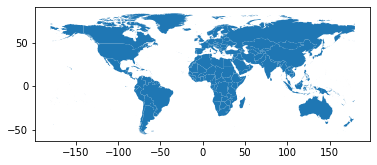

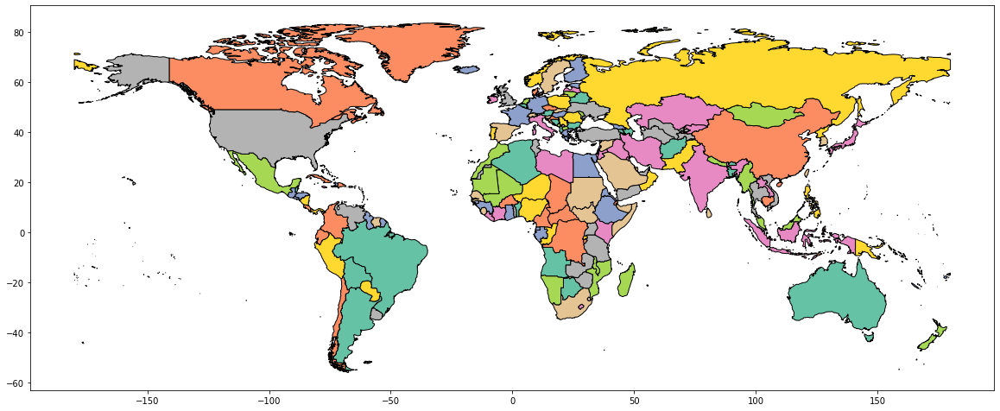

In [4]:
world.plot(column = 'sovereignt', figsize=(20, 30),
              edgecolor = 'black',
              #legend = True, #legend_kwds = leg_kwds, 
              cmap = 'Set2')
plt.show()

In [5]:
field=pd.read_csv('FieldMeasurements_5.csv')
#case_count_df['date']=pd.to_datetime(case_count_df['Specimen Collection Date'])
#cases_by_zip=case_count_df.groupby(['Zip']).sum()
#cases_by_zip['ZIP'] = cases_by_zip.index
#cases_by_zip = cases_by_zip.reset_index()
field.head(5)

,ID,Measurement Date,Latitude,Longitude,Fixed?,Distance(miles),Bearing,Direction,Type,Derived?,Value,Unit,Source,Description,Meter,Probe
0,142135,3/12/11 16:00,38.465,142.79,No,119.975962,52,NE,Gamma,Yes,0.300,mR/hr,DOD,USS RR Deck - reading taken at 1m.,NaN,ADM-300
1,142137,3/12/11 16:45,38.500,143.18,No,138.865233,56,NE,Gamma,Yes,0.900,mR/hr,DOD,USS RR Deck - 1 meter,NaN,NaN
2,142139,3/12/11 18:00,38.630,143.70,No,167.703709,59,ENE,Gamma,Yes,0.600,mR/hr,DOD,"USS RR - deck, closed window",NaN,NaN
3,142145,3/12/11 22:20,39.630,143.65,No,208.121761,42,NE,Beta,No,0.225,uCi/m2,DOD,Tractor - horizontal surface,NaN,NaN
4,142147,3/12/11 22:20,39.630,143.65,No,208.121761,42,NE,Beta,No,0.135,uCi/m2,DOD,Vertical Surface - USS RR,NaN,NaN


In [6]:
plants_pop=pd.read_csv('energy-pop-exposure-nuclear-plants-locations_plants.csv')
plants_pop.head(5)


,FID,Region,Country,Plant,NumReactor,Latitude,Longitude,p90_1200,p00_1200,p10_1200,...,p10r_600,p90_300,p00_300,p10_300,p90u_300,p00u_300,p10u_300,p90r_300,p00r_300,p10r_300
0,0,Europe - Western,SWEDEN,AGESTA,1,59.206022,18.082872,187382000,188684000,188250000,...,8972550.0,5013240.0,5227700.0,5471110.0,3426880.0,3596030.0,3764920.0,1586350.0,1631670.0,1706190
1,1,Europe - Western,SPAIN,ALMARAZ,2,39.808100,-5.696940,136675000,147718000,163429000,...,19453700.0,17756500.0,18187800.0,20185200.0,10986000.0,11415400.0,12689800.0,6770480.0,6772380.0,7495340
2,2,America - Latin,BRAZIL,ANGRA,3,-23.007857,-44.458098,99195200,113894000,127898000,...,18605600.0,39546400.0,44701700.0,50210600.0,32788500.0,37064600.0,41648300.0,6757940.0,7637110.0,8562300
3,3,America - Northern,UNITED STATES OF AMERICA,ARKANSAS ONE,2,35.310320,-93.231289,117830000,132729000,146482000,...,9498240.0,5603180.0,6226360.0,6866840.0,3779400.0,4198920.0,4633770.0,1823770.0,2027450.0,2233070
4,4,Europe - Western,SPAIN,ASCO,2,41.200000,0.566670,271854000,287134000,308922000,...,17594700.0,14398500.0,15095600.0,16830700.0,11215400.0,11773600.0,13151300.0,3183180.0,3322050.0,3679470


In [7]:
#geometry = [Point(xy) for xy in zip(plants_pop["Latitude"], plants_pop["Longitude"])]

In [8]:
field['geometry'] = field.apply(lambda x: Point((float(x.Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)
field.head(3)

,ID,Measurement Date,Latitude,Longitude,Fixed?,Distance(miles),Bearing,Direction,Type,Derived?,Value,Unit,Source,Description,Meter,Probe,geometry
0,142135,3/12/11 16:00,38.465,142.79,No,119.975962,52,NE,Gamma,Yes,0.3,mR/hr,DOD,USS RR Deck - reading taken at 1m.,NaN,ADM-300,POINT (142.79 38.465)
1,142137,3/12/11 16:45,38.500,143.18,No,138.865233,56,NE,Gamma,Yes,0.9,mR/hr,DOD,USS RR Deck - 1 meter,NaN,NaN,POINT (143.18 38.5)
2,142139,3/12/11 18:00,38.630,143.70,No,167.703709,59,ENE,Gamma,Yes,0.6,mR/hr,DOD,"USS RR - deck, closed window",NaN,NaN,POINT (143.7 38.63)


In [9]:
field_geo = gpd.GeoDataFrame(field, 
                           crs = world.crs, 
                           geometry = field['geometry'])


In [10]:
plants_pop['geometry'] = plants_pop.apply(lambda x: Point((float(x.Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)
plants_geo = gpd.GeoDataFrame(plants_pop, 
                           crs = world.crs, 
                           geometry = plants_pop['geometry'])
type(plants_geo)

geopandas.geodataframe.GeoDataFrame

In [11]:
plants_geo.geometry.centroid
center = plants_geo.geometry.centroid[42]
area_center = [center.y, center.x]
#GeoSeries.to_crs()
plants_map = folium.Map(location =  area_center, zoom_start = 12)
plants_map

<ipython-input-11-1e14717bb209>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  plants_geo.geometry.centroid
<ipython-input-11-1e14717bb209>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = plants_geo.geometry.centroid[42]


In [12]:
field_geo.geometry.centroid
f_center = field_geo.geometry.centroid[42]
f_area_center = [f_center.y, f_center.x]
#GeoSeries.to_crs()
field_map = folium.Map(location =  f_area_center, zoom_start = 12)
field_map

<ipython-input-12-89d2c982a087>:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  field_geo.geometry.centroid
<ipython-input-12-89d2c982a087>:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  f_center = field_geo.geometry.centroid[42]


In [13]:
i = 0
for row_index, row_values in plants_geo.iterrows():
    if i <3: 
        print('index is', row_index)
        print('values are:')
        print(' ')
        print(row_values)
        print('------------------------- ')
        i+=1

index is 0
values are:
 
FID                                     0
Region                   Europe - Western
Country                            SWEDEN
Plant                              AGESTA
NumReactor                              1
                         ...             
p10u_300                        3764920.0
p90r_300                        1586350.0
p00r_300                        1631670.0
p10r_300                          1706190
geometry      POINT (18.082872 59.206022)
Name: 0, Length: 62, dtype: object
------------------------- 
index is 1
values are:
 
FID                                  1
Region                Europe - Western
Country                          SPAIN
Plant                          ALMARAZ
NumReactor                           2
                        ...           
p10u_300                    12689800.0
p90r_300                     6770480.0
p00r_300                     6772380.0
p10r_300                       7495340
geometry      POINT (-5.69694 39.808

In [14]:
i = 0
for row_index, row_values in field_geo.iterrows():
    if i <3: 
        print('index is', row_index)
        print('values are:')
        print(' ')
        print(row_values)
        print('------------------------- ')
        i+=1

index is 0
values are:
 
ID                                              142135
Measurement Date                         3/12/11 16:00
Latitude                                        38.465
Longitude                                       142.79
Fixed?                                              No
Distance(miles)                             119.975962
Bearing                                             52
Direction                                           NE
Type                                             Gamma
Derived?                                           Yes
Value                                              0.3
Unit                                             mR/hr
Source                                             DOD
Description         USS RR Deck - reading taken at 1m.
Meter                                              NaN
Probe                                          ADM-300
geometry                         POINT (142.79 38.465)
Name: 0, dtype: object
-----------------

In [15]:
#draw our zip code area: 37207
world_plants = folium.Map(location =  area_center, zoom_start = 12)

folium.GeoJson(plants_geo).add_to(world_plants)

#iterate through stops_in_37207 to create locations and markers 
#for each bus stop
#remember for Folium locations, lat is listed first!!

for row_index, row_values in plants_geo.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['NumReactor'])
    icon=folium.Icon(color="blue",icon="bus", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(plants_map)
#world_plants.save('../maps/map37207.html')

#display our map
world_plants

In [16]:
#draw our zip code area: 37207
readings_map = folium.Map(location =  f_area_center, zoom_start = 5)

marker_cluster = MarkerCluster().add_to(readings_map)

folium.GeoJson(field_geo).add_to(readings_map)

#iterate through stops_in_37207 to create locations and markers 
#for each bus stop
#remember for Folium locations, lat is listed first!!

for row_index, row_values in field_geo.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Type'])
    icon=folium.Icon(color="blue",icon="bus", prefix='fa')
    
    marker = folium.Marker(
        location = loc, 
        popup = pop, icon = icon) 

    marker.add_to(marker_cluster)
#world_plants.save('../maps/map37207.html')

#display our map
readings_map

In [19]:
help(folium.Icon)

Help on class Icon in module folium.map:

class Icon(branca.element.MacroElement)
 |  Icon(color='blue', icon_color='white', icon='info-sign', angle=0, prefix='glyphicon', **kwargs)
 |  
 |  Creates an Icon object that will be rendered
 |  using Leaflet.awesome-markers.
 |  
 |  Parameters
 |  ----------
 |  color : str, default 'blue'
 |      The color of the marker. You can use:
 |  
 |          ['red', 'blue', 'green', 'purple', 'orange', 'darkred',
 |           'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue',
 |           'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen',
 |           'gray', 'black', 'lightgray']
 |  
 |  icon_color : str, default 'white'
 |      The color of the drawing on the marker. You can use colors above,
 |      or an html color code.
 |  icon : str, default 'info-sign'
 |      The name of the marker sign.
 |      See Font-Awesome website to choose yours.
 |      Warning : depending on the icon you choose you may need to adapt
 |      the `

In [ ]:
ax = world.plot(figsize = (20, 12), color = 'black')
plants_geo.plot( ax = ax, column = 'NumReactor',
                edgecolor='black',
                cmap=plt.cm.get_cmap('tab10'),
                  legend=True,
                  label=True,);
plt.show();

In [ ]:
plants_geo.head(3)

In [ ]:
plants_country=plants_geo.groupby(['Country']).sum()
plants_country=plants_country.reset_index()
by_school=sns.barplot(data=plants_country, x="Country", y="NumReactor", palette='tab10', linewidth=1.5)
by_school.set_xticklabels(by_school.get_xticklabels(), 
                          rotation=90, 
                          horizontalalignment='right')

sns.set(rc={'figure.figsize':(11.7,8.27)})

In [ ]:
# sort df by Count column
pc_s = plants_country.sort_values(['NumReactor']).reset_index(drop=True)


plt.figure(figsize=(12,8))
# plot barh chart with index as x values
ax = sns.barplot(pc_s.index, pc_s.NumReactor)
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
ax.set(xlabel="Dim", ylabel='Count')
# add proper Dim values as x labels
ax.set_xticklabels(pc_s['Country'])
for item in ax.get_xticklabels(): item.set_rotation(90)
for i, v in enumerate(pc_s['NumReactor'].iteritems()):        
    ax.text(i ,v[1], "{:,}".format(v[1]), color='m', va ='bottom')
plt.tight_layout()
plt.show()

In [ ]:
plt.pie(pc_s['NumReactor'])

In [ ]:
sns.displot(
    data=plants_country,
    x="NumReactor", hue="Country",
    kind="kde", height=6,
    multiple="fill", clip=(0, None),
    palette="ch:rot=-.25,hue=1,light=.75")